# Santander Customer Transaction Prediction

In [1]:
# Load required libraries
import os
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Set working directory
os.chdir("E:\project")

In [3]:
# Importing the train and test data-set.
# here train set will be used to bulid and test the Model
# The Model will be used to predict the value of target column in the test set
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [4]:
# taking a look at the data
# gives first five rows of data set
train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [5]:
# Getting the number of variables and obervation in the dataset
train.shape

(200000, 202)

In [6]:
test.head()

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846


In [7]:
test.shape

(200000, 201)

In [8]:
# saving id_code column in different dataframe for output
test_output = pd.DataFrame(test['ID_code'])

In [9]:
# removing ID_column from both data set as it does not contain any information for model building
train = train.drop(['ID_code'], axis=1)
test = test.drop(['ID_code'], axis=1)

In [10]:
# tells unique value count in each variable
for feature in train.columns:
    print(feature ,':', train[feature].nunique())

target : 2
var_0 : 94672
var_1 : 108932
var_2 : 86555
var_3 : 74597
var_4 : 63515
var_5 : 141029
var_6 : 38599
var_7 : 103063
var_8 : 98617
var_9 : 49417
var_10 : 128764
var_11 : 130193
var_12 : 9561
var_13 : 115181
var_14 : 79122
var_15 : 19810
var_16 : 86918
var_17 : 137823
var_18 : 139515
var_19 : 144180
var_20 : 127764
var_21 : 140062
var_22 : 90660
var_23 : 24913
var_24 : 105101
var_25 : 14853
var_26 : 127089
var_27 : 60185
var_28 : 35859
var_29 : 88339
var_30 : 145977
var_31 : 77388
var_32 : 85964
var_33 : 112239
var_34 : 25164
var_35 : 122384
var_36 : 96404
var_37 : 79040
var_38 : 115366
var_39 : 112674
var_40 : 141878
var_41 : 131896
var_42 : 31592
var_43 : 15188
var_44 : 127702
var_45 : 169968
var_46 : 93450
var_47 : 154781
var_48 : 152039
var_49 : 140641
var_50 : 32308
var_51 : 143455
var_52 : 121313
var_53 : 33460
var_54 : 144776
var_55 : 128077
var_56 : 103045
var_57 : 35545
var_58 : 113907
var_59 : 37744
var_60 : 113763
var_61 : 159369
var_62 : 74777
var_63 : 97098
var_64 

In [11]:
# Convert data to required types
train['target'] = train['target'].astype('object')

In [12]:
# Saving Numerical and categorical variables in different list
cat_var = train.select_dtypes('category').columns
num_var = train.select_dtypes(np.number).columns

# Exploratory Analysis

In [13]:
# Getting further info about the dataset
# data type of data
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 201 entries, target to var_199
dtypes: float64(200), object(1)
memory usage: 306.7+ MB


In [14]:
# getting summary of dataset
train.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,7.567236,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,1.235070,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,3.970500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,6.618800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,7.629600,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,8.584425,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,11.150600,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [15]:
# Getting the info about the dataset
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 200 entries, var_0 to var_199
dtypes: float64(200)
memory usage: 305.2 MB


In [16]:
# getting summary of dataset
test.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.658737,-1.624244,10.707452,6.788214,11.076399,-5.050558,5.415164,16.529143,0.277135,7.569407,...,3.189766,7.458269,1.925944,3.322016,17.996967,-0.133657,2.290899,8.912428,15.869184,-3.246342
std,3.036716,4.040509,2.633888,2.052724,1.616456,7.869293,0.864686,3.424482,3.333375,1.231865,...,4.551239,3.025189,1.479966,3.995599,3.140652,1.429678,5.446346,0.920904,3.008717,10.398589
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300,...,-14.093300,-2.407000,-3.340900,-11.413100,9.382800,-4.911900,-13.944200,6.169600,6.584000,-39.457800
25%,8.442975,-4.700125,8.735600,5.230500,9.891075,-11.201400,4.772600,13.933900,-2.303900,6.623800,...,-0.095000,5.166500,0.882975,0.587600,15.634775,-1.160700,-1.948600,8.260075,13.847275,-11.124000
50%,10.513800,-1.590500,10.560700,6.822350,11.099750,-4.834100,5.391600,16.422700,0.372000,7.632000,...,3.162400,7.379000,1.892600,3.428500,17.977600,-0.162000,2.403600,8.892800,15.943400,-2.725950
75%,12.739600,1.343400,12.495025,8.327600,12.253400,0.942575,6.005800,19.094550,2.930025,8.584825,...,6.336475,9.531100,2.956000,6.174200,20.391725,0.837900,6.519800,9.595900,18.045200,4.935400
max,22.323400,9.385100,18.714100,13.142000,16.037100,17.253700,8.302500,28.292800,9.665500,11.003600,...,20.359000,16.716500,8.005000,17.632600,27.947800,4.545400,15.920700,12.275800,26.538400,27.907400


In [17]:
train['target'].value_counts()
# we have 1,79902 '0' values and 20,098 '1' values
# we can see that the data is unbalanced

0    179902
1     20098
Name: target, dtype: int64

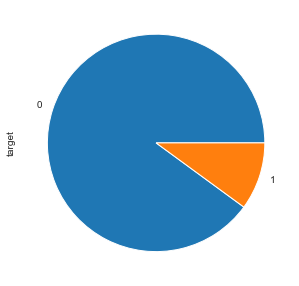

In [18]:
# setting grid for all charts
sns.set_style('darkgrid')
# visualizing target variable
plt.figure(figsize=(5,5))
train['target'].value_counts().plot.pie()

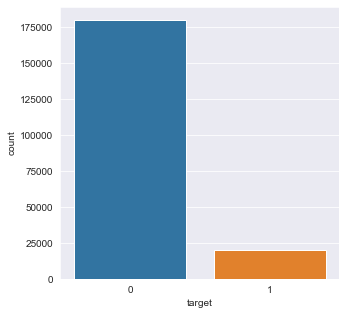

In [19]:
plt.figure(figsize=(5,5))
sns.countplot(x='target', data=train)

Distribution of Train features


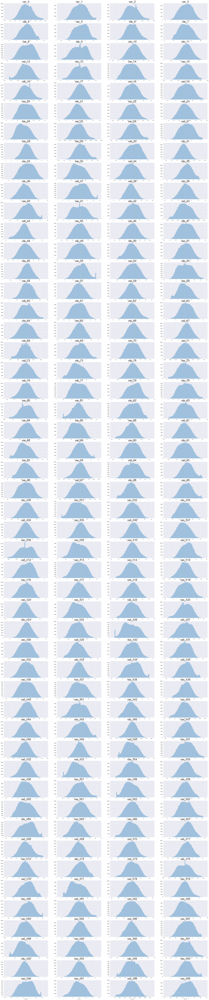

In [20]:
# draw histograms of numeric data in training set 
print("Distribution of Train features")
plt.figure(figsize=(40,200))
for i,col in enumerate(num_var):
    plt.subplot(50,4,i+1)
    sns.distplot(train[col], kde=False)
    plt.title(col, fontsize=30)

Distribution of Test features


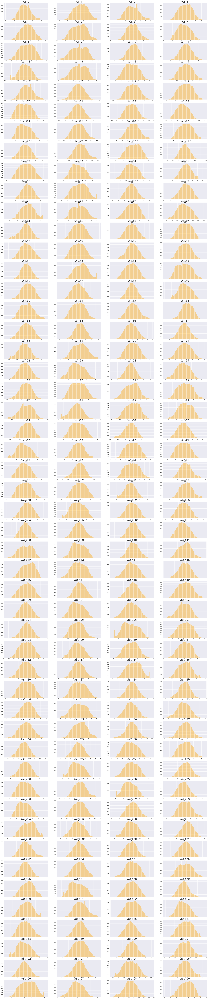

In [21]:
# draw histograms of numeric data in Test set 
print("Distribution of Test features")
plt.figure(figsize=(40,200))
for i,col in enumerate(num_var):
    plt.subplot(50,4,i+1)
    sns.distplot(test[col], kde=False, color='orange')
    plt.title(col, fontsize=30)

Distribution of features per target class


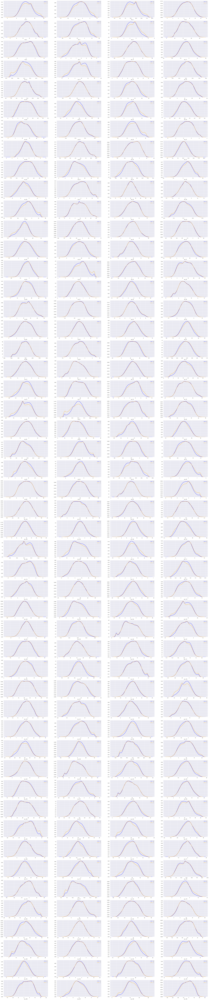

In [22]:
# Almost all features follow normalised distribution

print("Distribution of features per target class")
plt.figure(figsize=(40,200))
for i,col in enumerate(num_var):
    plt.subplot(50,4,i+1)
    sns.distplot(train[train['target']==0][col],hist=False,label='0',color='blue')
    sns.distplot(train[train['target']==1][col],hist=False,label='1',color='orange')

Distribution of features for test and train dataset


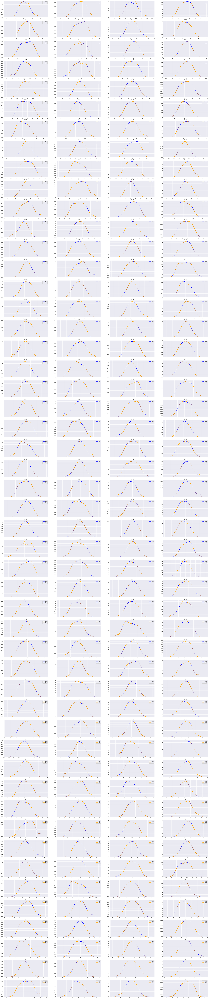

In [23]:
print("Distribution of features for test and train dataset")
plt.figure(figsize=(40,200))
for i,col in enumerate(num_var):
    plt.subplot(50,4,i+1)
    sns.distplot(train[col],hist=False,label='train',color='blue')
    sns.distplot(test[col],hist=False,label='test',color='orange')

Boxplot of Train features


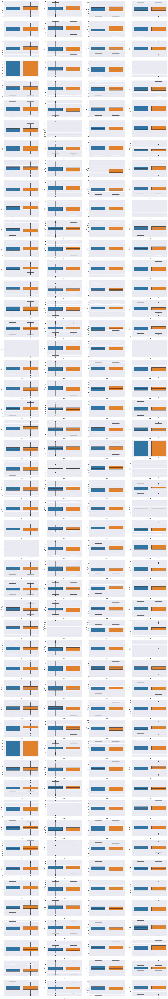

In [47]:
# Train and test are well balanced with distribution of the numeric variables.
# draw boxplot of numeric data in Test set 
print("Boxplot of Train features")
plt.figure(figsize=(40,250))
for i,col in enumerate(num_var):
    plt.subplot(50,4,i+1)
    sns.boxplot(x="target", y=col, data=train, orient='v')
# from plots we can clearly see that there are few outliers in our dataset

# Missing value Analysis

In [25]:
train.isnull().sum().sum()

0

In [26]:
test.isnull().sum().sum()

0

In [27]:
# imputing missing values with mean and median

if train.isnull().sum().sum() != 0 | test.isnull().sum().sum() != 0:

    for feature in num_var:
        train[feature] = train[feature].fillna(train[feature].median())
        #train[feature] = train[feature].fillna(train[feature].mean())
    
        test[feature] = test[feature].fillna(test[feature].median())
        #test[feature] = test[feature].fillna(test[feature].mean())
else:
    print('No null value in data')

No null value in data


# Outliers Analysis

In [28]:
# # handling outliers in Train data-set
# Q1 = train.quantile(0.25)
# Q3 = train.quantile(0.75)
# IQR = Q3 - Q1

# for feature in num_var:
#     train.loc[(train[feature] < (Q1[feature] - 1.5 * IQR[feature])) | 
#               (train[feature] > (Q3[feature] + 1.5 * IQR[feature])),feature] = np.nan
    
#     #Impute with mean
#     #train[feature] = train[feature].fillna(train[feature].mean())

#     #Impute with median
#     train[feature] = train[feature].fillna(train[feature].median())

In [29]:
# # handling outliers in test data-set
# Q1 = test.quantile(0.25)
# Q3 = test.quantile(0.75)
# IQR = Q3 - Q1

# for feature in num_var:
#     test.loc[(test[feature] < (Q1[feature] - 1.5 * IQR[feature])) | 
#               (test[feature] > (Q3[feature] + 1.5 * IQR[feature])),feature] = np.nan
    
#     #Impute with mean
#     #test[feature] = test[feature].fillna(test[feature].mean())

#     #Impute with median
#     test[feature] = test[feature].fillna(test[feature].median())

# Feature Selection

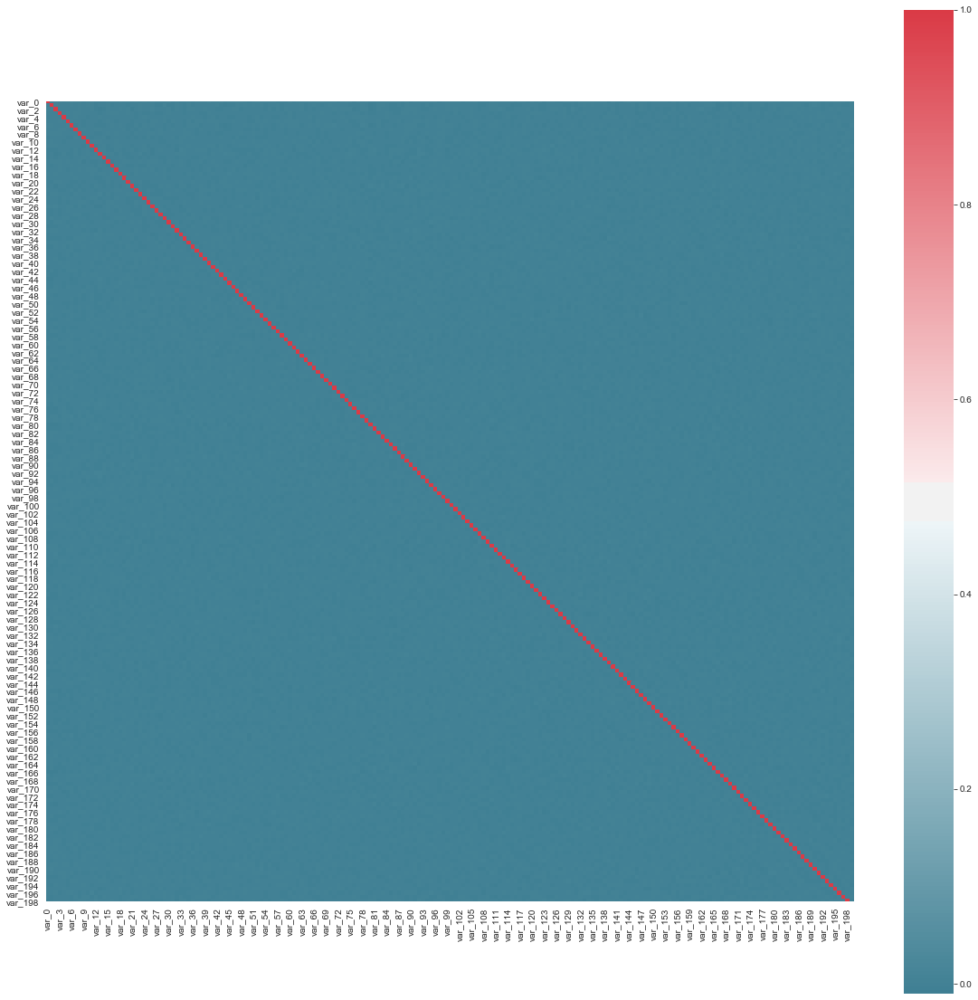

In [30]:
# Correlation plot
# Set the width and hieght of the plot
f, ax = plt.subplots(figsize=(20, 20))
corr = train.corr()

# Plot using seaborn library
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
# not removing any variable here as features are not highly correlated with each other.

In [31]:
np.fill_diagonal(corr.values,np.nan)
corr.max().max(),corr.min().min()

(0.009713658349534146, -0.009844361358419677)

In [32]:
# saving dependent and independent variable in different array

train = train.astype(np.integer)
test = test.astype(np.integer)
test_temp = test.copy()

X = train.iloc[:, 1:].values
y = train.iloc[:, 0].values
test = test.iloc[:, 0:200].values

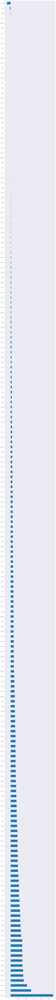

(200000, 175)
(200000, 175)


In [33]:
# apply SelectKBest class to extract top best features

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

bestfeatures = SelectKBest(score_func=f_classif, k= (train.shape[1] - 1)).fit(X,y)

feat_score = pd.Series(bestfeatures.scores_, index=train.columns.values[1:])
plt.figure(figsize=(10,200))
feat_score.nlargest((train.shape[1] - 1)).plot(kind='barh')
plt.show()

features_selected = 175

X_selectKbest = train[feat_score.nlargest(features_selected).index]
X_selectKbest = X_selectKbest.iloc[:, 0:].values

test_selectKbest = test_temp[feat_score.nlargest(features_selected).index]
test_selectKbest = test_selectKbest.iloc[:, 0:].values

print(X_selectKbest.shape)
print(test_selectKbest.shape)

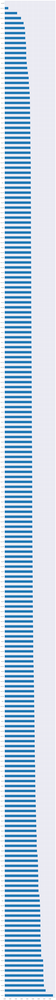

(200000, 75)
(200000, 75)


In [34]:
# Tree-based feature selection
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel

etc_model = ExtraTreesClassifier(n_estimators=50).fit(X,y)

# plot graph of feature importances for better visualization
plt.figure(figsize=(10,200))
feat_importances = pd.Series(etc_model.feature_importances_, index=train.columns.values[1:])
feat_importances.nlargest((train.shape[1] - 1)).plot(kind='barh')
plt.show()

# selecting features using ExtraTreesClassifier
etc_model = SelectFromModel(etc_model, prefit=True)
X_etc = etc_model.transform(X)
test_etc = etc_model.transform(test_temp)
print(X_etc.shape)
print(test_etc.shape)

In [35]:
# Select features on the base of model

X = X_selectKbest
#X = X_etc

test = test_selectKbest
#test = test_etc

# Sampling

In [36]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

# Scaling

In [37]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
test = sc.transform(test)

# PCA

Text(0, 0.5, 'cumulative explained variance')

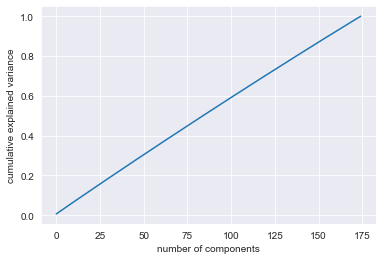

In [38]:
# Applying PCA
from sklearn.decomposition import PCA

pca_vizual = PCA().fit(X_train)
plt.plot(np.cumsum(pca_vizual.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [39]:
# pca = PCA(n_components = 175).fit(X_train)
# X_train = pca.transform(X_train)
# X_test = pca.transform(X_test)
# test = pca.transform(test)

# Model Development

In [40]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

def classification_model(model):
    
    select_model = model
    
    if select_model=='logistic':
        # Fitting Logistic Regression to the Training set
        classifier = LogisticRegression(random_state = 42).fit(X_train, y_train)
    
    elif select_model=='NB':
        # Fitting Naive Bayes to the Training set
        classifier = GaussianNB().fit(X_train, y_train)
        
    elif select_model=='RF':
        # Fitting Random Forest Classification to the Training set
        classifier = RandomForestClassifier(n_estimators = 10,
                                               criterion = 'entropy', random_state = 42).fit(X_train, y_train)
        
    elif select_model=='XGB':    
        # Training XGBoost on the Training set
        classifier = XGBClassifier().fit(X_train, y_train)
        
    else:
        classifier = 'Incorrect Input'
        
    return classifier

In [41]:
# Choose estimator

#model_selected = 'logistic'
model_selected = 'NB'
#model_selected = 'RF'
#model_selected = 'XGB'

classifier = classification_model(model_selected)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

print(classifier)

GaussianNB(priors=None, var_smoothing=1e-09)


[[52658  1198]
 [ 3988  2156]]
Accuracy is: 0.9136
FNR is: 64.91
Precision is: 0.6428
Recall is: 0.3509
F1 Score is: 0.4540


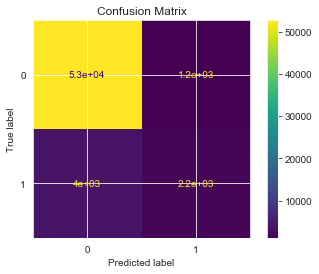

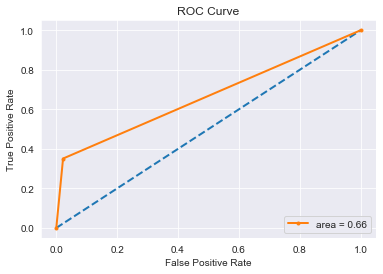

Text(0.5, 1.0, 'Precision-Recall curve')

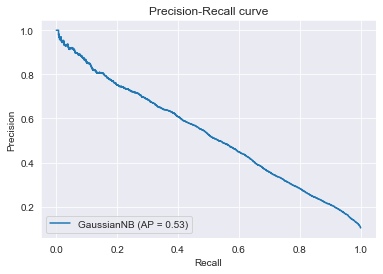

In [42]:
# libraries to make pr and roc curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

# Making the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

# let us save TP, TN, FP, FN
TN = cm[0,0]
FN = cm[1,0]
TP = cm[1,1]
FP = cm[0,1]

accuracy = accuracy_score(y_test, y_pred)
FNR = (FN*100)/(FN+TP)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1_score = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, _ = roc_curve(y_test, y_pred)

print(cm)
print('Accuracy is: %0.4f' %accuracy)
print('FNR is: %0.2f' %FNR)
print('Precision is: %0.4f' %precision)
print('Recall is: %0.4f' %recall)
print('F1 Score is: %0.4f' %f1_score)

# plot Confusion Matrix
plot_confusion_matrix(classifier, X_test, y_test)
plt.title('Confusion Matrix')
plt.show()

# Receiver Operating Characteristic
# plot model roc curve 
plt.plot([0, 1], [0, 1], lw=2, linestyle='--')
plt.plot(fpr, tpr, marker='.', lw=2, label='area = %0.2f' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

#Precision-Recall Curve
disp = plot_precision_recall_curve(classifier, X_test, y_test)
disp.ax_.set_title('Precision-Recall curve')

In [43]:
# Applying k-Fold Cross Validation
from sklearn.model_selection import cross_val_score
scores = cross_val_score(estimator = classifier, X = X_train, y = y_train, cv = 10, scoring='f1')
print("f1_score: {:.2f} %".format(scores.mean()*100))
print("Standard Deviation: {:.2f} %".format(scores.std()*100))

f1_score: 44.11 %
Standard Deviation: 0.76 %


#  Predicting Test set and saving output file

In [44]:
test_pred = classifier.predict(test)

test_output['target'] = test_pred
# Writing a csv (output)
#test_output.to_csv("test_output_python.csv", index = False)

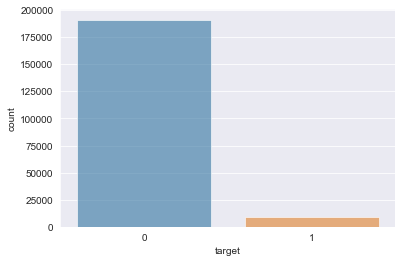

In [45]:
# visualizing output target variable
sns.countplot(test_output[test_output.columns[-1]], alpha=0.6)

In [46]:
test_output['target'].value_counts()

0    191198
1      8802
Name: target, dtype: int64